# SETDB1 epigenetics M.muslulus Paola 2019

##### Costas Bouyioukos, Paola Cruz and Slimane Ait-Si-Ali

## GO enrichment analysis and clustering of diff-expressed genes in two SETDB1 KO (CA and KK).


### Load packages

In [52]:
# Load packages.
library(magrittr)
library(DOSE)
library(clusterProfiler)
library(org.Mm.eg.db)

### Data pre-processing

In [55]:
# Load data
dKK <- read.table("deSeq2_DiffAnal_WT_KK.tab", header=TRUE)
dCA <- read.table("deSeq2_DiffAnal_WT_CA.tab", header=TRUE)

# Add a column with the WikiGene ID.
convt <- read.table("wikiID_geneID.txt", sep = "\t")  # tabledownloaded from ENSEMBL BioMart
colnames(convt) <- c("WikiGeneID", "GeneID")

# keep only the rows with complete data.
dKK <- dKK[complete.cases(dKK),]
dCA <- dCA[complete.cases(dCA),]

# Keep only the significantly differentially expressed.
dKKs <- dKK[dKK$padj<=0.05,]
dCAs <- dCA[dCA$padj<=0.05,]

# Keep only the ones with logFC more (or less) than 1.
dKKsf1 <- dKKs[abs(dKKs$log2FoldChange)>=1,]
dCAsf1 <- dCAs[abs(dCAs$log2FoldChange)>=1,]
# Keep only the ones with logFC more (or less) than 0.5.
dKKsf05 <- dKKs[abs(dKKs$log2FoldChange)>=0.5,]
dCAsf05 <- dCAs[abs(dCAs$log2FoldChange)>=0.5,]
# Keep only the ones with logFC more (or less) than 0.1.
dKKsf01 <- dKKs[abs(dKKs$log2FoldChange)>=0.1,]
dCAsf01 <- dCAs[abs(dCAs$log2FoldChange)>=0.1,]

In [57]:
# create the name/logFC objects keep only the significant genes
geneListCA1 <- dCAsf1[["log2FoldChange"]]
geneListKK1 <- dKKsf1[["log2FoldChange"]]
namesCA1 <- as.character(dCAsf1[["Gene_ID"]])
namesKK1 <- as.character(dKKsf1[["Gene_ID"]])
names(geneListCA1) <- namesCA1
names(geneListKK1) <- namesKK1
length(namesCA1)
length(namesKK1)
geneListCA05 <- dCAsf05[["log2FoldChange"]]
geneListKK05 <- dKKsf05[["log2FoldChange"]]
namesCA05 <- as.character(dCAsf05[["Gene_ID"]])
namesKK05 <- as.character(dKKsf05[["Gene_ID"]])
names(geneListCA05) <- namesCA05
names(geneListKK05) <- namesKK05
length(namesCA05)
length(namesKK05)
geneListCA01 <- dCAsf01[["log2FoldChange"]]
geneListKK01 <- dKKsf01[["log2FoldChange"]]
namesCA01 <- as.character(dCAsf01[["Gene_ID"]])
namesKK01 <- as.character(dKKsf01[["Gene_ID"]])
names(geneListCA01) <- namesCA01
names(geneListKK01) <- namesKK01
length(namesCA01)
length(namesKK01)

[1] 544

[1] 179

[1] 2043

[1] 723

[1] 4870

[1] 1723

Significantly (pv <= 0.05) differentially expressed genes:

1. LogFC >= 1
  - 544 differentially expressed genes for CA
  - 723 differentially expressed genes for KK

2. LogFC >= 0.5
  - 2043 for CA
  - 723 for KK

3. LogFC >= 0.1
  - 4870 for CA
  - 1723 for KK

select their WikiPath IDs:

In [58]:
write(namesCA1, file="deSeq2_DiffAnal_WT_CA_p05_FC1_geneNames.txt")
write(namesKK1, file="deSeq2_DiffAnal_WT_KK_p05_FC1_geneNames.txt")
write(namesCA05, file="deSeq2_DiffAnal_WT_CA_p05_FC05_geneNames.txt")
write(namesKK05, file="deSeq2_DiffAnal_WT_KK_p05_FC05_geneNames.txt")
write(namesCA01, file="deSeq2_DiffAnal_WT_CA_p05_FC01_geneNames.txt")
write(namesKK01, file="deSeq2_DiffAnal_WT_KK_p05_FC01_geneNames.txt")

In [59]:
# Get the wikipathID names.
namesCAwiki1 <- convt[convt$GeneID %in% namesCA1,]$WikiGeneID
namesKKwiki1 <- convt[convt$GeneID %in% namesKK1,]$WikiGeneID
#namesCAwiki <- as.character(namesCAwiki[complete.cases(namesCAwiki)])
#namesKKwiki <- as.character(namesKKwiki[complete.cases(namesKKwiki)])
length(namesCAwiki1)
length(namesKKwiki1)

[1] 410

[1] 115

**these are the genes for which we have a WIkiGeneID**

### WikiPathways enrichment

In [60]:
# Prepare the reference pathways and the TERM2 objects.
wp2genes <- read.gmt("../wikiPatways_Mm/wikipathways-20190110-gmt-Mus_musculus.gmt")
wp2genes <- wp2genes %>% tidyr::separate(ont, c("name","version","wpid","org"), "%")
wpid2gene <- wp2genes %>% dplyr::select(wpid, gene) #TERM2GENE
wpid2name <- wp2genes %>% dplyr::select(wpid, name) #TERM2NAME

In [61]:
# Do the actual enrichment experiment.
ewpCA1 <- enricher(namesCAwiki1, TERM2GENE = wpid2gene, TERM2NAME = wpid2name)
ewpKK1 <- enricher(namesKKwiki1, TERM2GENE = wpid2gene, TERM2NAME = wpid2name)

In [65]:
as.data.frame(ewpKK1)

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
WP441,WP441,Matrix Metalloproteinases,3/29,29/4572,0.0007506358,0.02852416,0.027655,17381/17395/240047,3


#### Results WikiPath enrichment lFC>=1:
 - There are no significant enrichment in WikiPathways for the 410 genes (logFC>1) of the CA experiments.
 - The 458 KK diff. expressed genes show enrichment in the WP441 WikiPathway of metaloproteases.

**We will try with all the differentially expressed genes (without filtering for logFC) now:

In [66]:
# Prepare two new gene lists without filtering for logFC.
namesCAs <- as.character(dCAs[["Gene_ID"]])
namesCAwikiS <- convt[convt$GeneID %in% namesCAs,]$WikiGeneID
namesKKs <- as.character(dKKs[["Gene_ID"]])
namesKKwikiS <- convt[convt$GeneID %in% namesKKs,]$WikiGeneID
length(namesCAwikiS)
length(namesKKwikiS)

[1] 4093

[1] 1438

This selection yielded:

1438 differentially expressed genes for KK and

4093 differentially expressed genes for CA

In [84]:
# Do the actual enrichment experiment.
ewpCA0 <- enricher(namesCAwikiS, TERM2GENE = wpid2gene, TERM2NAME = wpid2name)
ewpKK0 <- enricher(namesKKwikiS, TERM2GENE = wpid2gene, TERM2NAME = wpid2name)

### RESULTS WikiPathways Enrichemnt!

In [85]:
as.data.frame(ewpCA0)

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
WP1763,WP1763,PluriNetWork,119/1069,294/4572,1.072681e-11,1.651928e-09,1.400131e-09,104156/104263/104383/107932/108155/110147/11479/11614/11651/11909/12159/12224/12367/12443/12550/12591/12914/13017/13139/13164/13194/13435/13590/13619/14056/14175/14182/14388/14465/14472/14797/15162/15182/15221/15251/15894/15901/16324/16337/16367/16412/16600/16842/16878/16880/16973/17127/17246/17342/17344/17865/17869/18033/18109/18119/18128/18158/18160/18424/18707/18712/18854/19211/19280/19651/19821/19878/20130/20230/20393/20683/20689/20750/20841/20997/21414/21420/21432/216850/21803/21848/21849/21886/21888/22018/22286/223775/22418/22589/22592/226432/22702/22715/22772/229542/233726/245688/26380/26424/26611/328572/381022/50764/52615/56380/58198/63913/64058/65969/66923/69890/71950/73693/74178/76007/76509/77683/81879/83814,119
WP2573,WP2573,Primary Focal Segmental Glomerulosclerosis FSGS,32/1069,72/4572,5.818609e-05,4.480329e-03,3.797408e-03,110829/11603/11651/12323/12492/12558/14083/14107/14360/16400/16412/16416/16776/16779/16973/17380/17886/18128/18793/192897/214444/21803/21894/22288/22352/243911/27205/54631/57342/60595/70435/74055,32
WP103,WP103,Cholesterol Biosynthesis,10/1069,15/4572,4.364825e-04,2.240610e-02,1.899082e-02,13121/13360/14137/15357/16987/18194/20775/235293/319554/66234,10


In [86]:
as.data.frame(ewpKK0)

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
WP1763,WP1763,PluriNetWork,49/415,294/4572,1.290965e-05,0.001858989,0.001671459,104156/110147/11614/12443/12591/13017/13139/13164/13435/13590/14175/14182/15162/15894/16195/16367/16600/16842/16880/17191/17344/17869/18033/18109/18424/18707/19280/20230/20393/20689/20997/21848/22286/223775/22589/22592/245688/26380/26424/328572/54427/58198/64058/69890/71950/74178/76007/76509/77683,49
WP723,WP723,Wnt Signaling Pathway and Pluripotency,21/415,97/4572,1.170099e-04,0.008424712,0.007574851,12443/12444/13017/14283/14367/14368/14369/14370/16476/16835/16842/17869/18755/21413/22415/26931/328572/57265/71887/71950/71978,21
WP403,WP403,Wnt Signaling Pathway,14/415,60/4572,7.275330e-04,0.034921585,0.031398794,12443/12444/14283/14367/14368/14369/14370/16476/16835/17869/18755/22415/26931/57265,14


#### Results WikiPath enrichment lFC>=0.1- There are 3 enriched pathways for genes of the CA experiments.
 - There are 3 enriched pathways for th CA differentially expressed genes.
 - And 3 more, with the 1763 pluripotency to be common, for the KK.

**We will try with all the differentially expressed genes (without filtering for logFC) now:

### 2.GSEA enrichment

In [73]:
# Prepare the geneLists (ordered gene list)

# These are the gene names that we have Wiki IDs.
nn <- unique(convt[convt$WikiGene.ID %in% namesCAwiki,]$Gene.name)
mm <- unique(convt[convt$WikiGene.ID %in% namesKKwiki,]$Gene.name)

glCA <- geneListCA[names(geneListCA) %in% nn]
glKK <- geneListKK[names(geneListKK) %in% mm]

In [74]:
length(unique(convt[convt$Gene.name %in% names(glCA),]$WikiGene.ID))
length(names(glCA))

[1] 0

[1] 0

In [75]:
length(convt[convt$WikiGeneID %in% wpid2gene$gene,]$GeneID)

[1] 4293

In [76]:
subset(convt, convt$WikiGeneID == wpid2gene[1,]$gene)[1,]$GeneID  # Just to check

[1] Il1a
29869 Levels: 0610006L08Rik 0610009B22Rik 0610009E02Rik ... Zzz3

In [77]:
# Conversion from wikipath to 
wpid2geneID <- data.frame();
for (i in 1:nrow(wpid2gene)) {
    wp <- wpid2gene[i,]$wpid
    gn <- wpid2gene[i,]$gene
    gid <- as.character(subset(convt, convt$WikiGeneID == gn)[1,]$GeneID)
    wpid2geneID <- rbind(wpid2geneID, data.frame(wp, gid))
}
wpid2geneID <- wpid2geneID[complete.cases(wpid2geneID),]

In [78]:
dim(wpid2geneID)

[1] 9109    2

In [79]:
head(wpid2geneID)

,wp,gid
1,WP571,Il1a
2,WP571,Casp8
3,WP571,Mapk8
5,WP571,Rb1
6,WP571,Pak1
7,WP571,Mapkapk2


**This is the wiki->to->genes conversion data frame**

In [87]:
# Sort the gene lists.
geneListCA1 <- sort(geneListCA1, decreasing = TRUE)
geneListKK1 <- sort(geneListKK1, decreasing = TRUE)
geneListCA01 <- sort(geneListCA01, decreasing = TRUE)
geneListKK01 <- sort(geneListKK01, decreasing = TRUE)

In [89]:
ewpgsCA1 <- GSEA(geneListCA1, TERM2GENE = wpid2geneID, TERM2NAME = wpid2name, verbose=FALSE)
ewpgsKK1 <- GSEA(geneListKK1, TERM2GENE = wpid2geneID, TERM2NAME = wpid2name, verbose=FALSE)

no term enriched under specific pvalueCutoff...


In [90]:
as.data.frame(ewpCA1)

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
WP85,WP85,Focal Adhesion,13,-0.6210363,-2.772034,0.003802281,0.004273504,NA,174,"tags=92%, list=32%, signal=64%",Zyx/Pdgfra/Itgb3/Lama1/Col4a2/Spp1/Col4a1/Vwf/Pdgfc/Ccnd2/Hck
WP2841,WP2841,Focal Adhesion-PI3K-Akt-mTOR-signaling pathway,14,-0.7379856,-3.390236,0.004048583,0.004273504,NA,111,"tags=93%, list=20%, signal=76%",Pdgfra/Itgb3/Lama1/Col4a2/Fgf15/Spp1/Col4a1/Vwf/Pdgfc/Kitl/Fgf1/Tek
WP1763,WP1763,PluriNetWork,18,-0.5260045,-2.690762,0.004273504,0.004273504,NA,130,"tags=72%, list=24%, signal=57%",Sall1/Tcl1/Spp1/Gata6/Plet1/Sgk1/Klf4/Lefty1/Cubn/Hck/Inhbb/Sall3


**Again a gene set related to pluripotency was found**

In [91]:
ewpgsCA01 <- GSEA(geneListCA01, TERM2GENE = wpid2geneID, TERM2NAME = wpid2name, verbose=FALSE)
ewpgsKK01 <- GSEA(geneListKK01, TERM2GENE = wpid2geneID, TERM2NAME = wpid2name, verbose=FALSE)

no term enriched under specific pvalueCutoff...
no term enriched under specific pvalueCutoff...


### 3.MSIG enrichment

In [92]:
library(msigdbr)

In [93]:
m_df <- msigdbr(species = "Mus musculus")

In [97]:
m_df$gs_id <- m_df$gene_symbol # BIG TRICK TO SWAP THE COLUMN NAMES!!!!!!
esigCA1 <- enricher(namesCA1, TERM2GENE=m_df)
esigKK1 <- enricher(namesKK1, TERM2GENE=m_df)

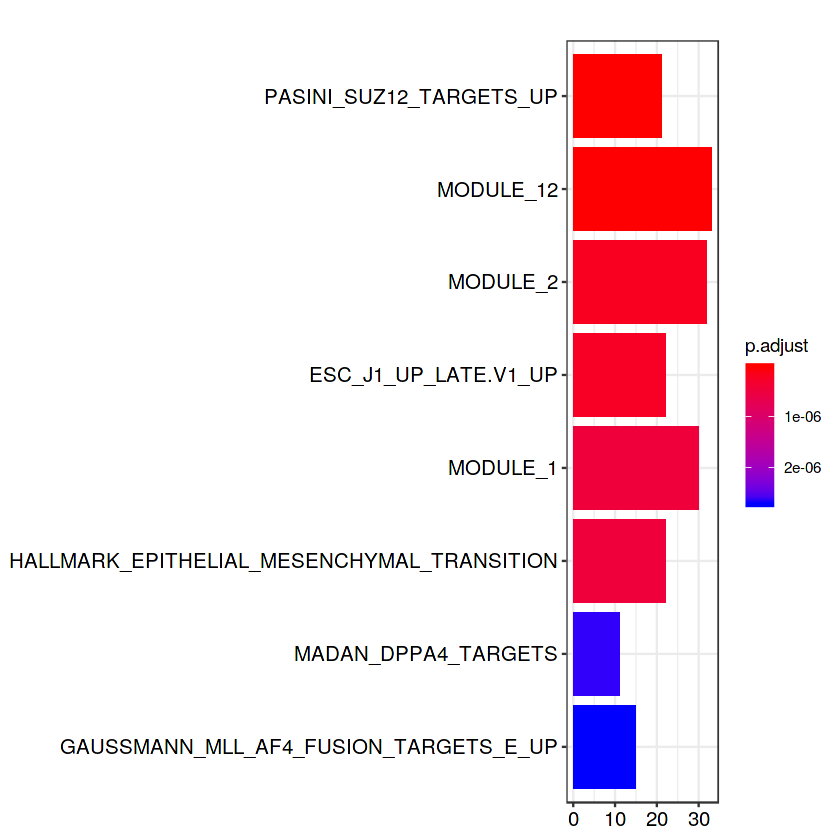

In [104]:
barplot(esigCA1, n=50)

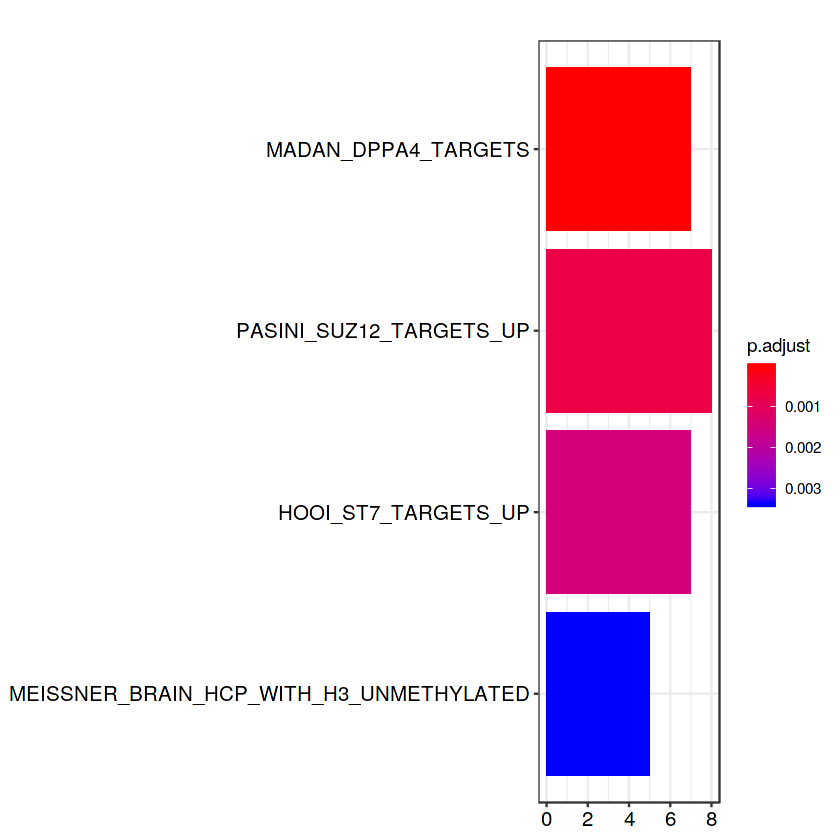

In [105]:
barplot(esigKK1, n=50)

##### GSEA analysis

In [100]:
# Sort the lists.
geneListCA1 <- sort(geneListCA1, decreasing = TRUE)
geneListKK1 <- sort(geneListKK1, decreasing = TRUE)
geneListCA01 <- sort(geneListCA01, decreasing = TRUE)
geneListKK01 <- sort(geneListKK01, decreasing = TRUE)

In [106]:
esigsCA1 <- GSEA(geneListCA1, TERM2GENE = m_df)
esigsKK1 <- GSEA(geneListKK1, TERM2GENE = m_df)

preparing geneSet collections...
GSEA analysis...
no term enriched under specific pvalueCutoff...
preparing geneSet collections...
GSEA analysis...
leading edge analysis...
done...


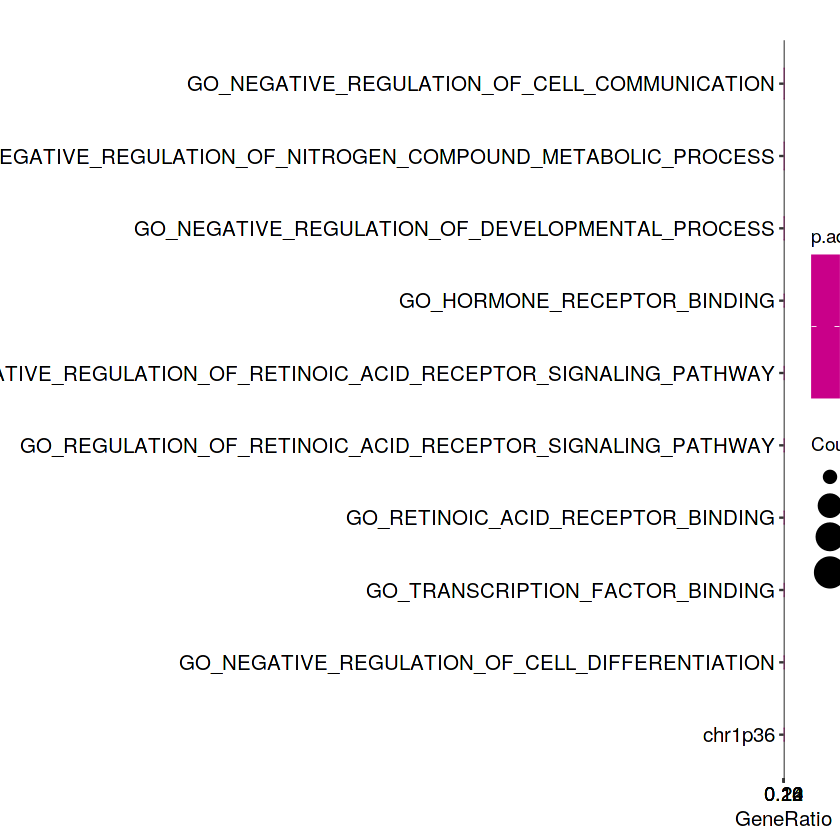

In [113]:
dotplot(esigsKK1, )

In [114]:
# Do the same for the 0.1lFC
esigsCA01 <- GSEA(geneListCA01, TERM2GENE = m_df)
esigsKK01 <- GSEA(geneListKK01, TERM2GENE = m_df)

preparing geneSet collections...
GSEA analysis...
no term enriched under specific pvalueCutoff...
preparing geneSet collections...
GSEA analysis...
no term enriched under specific pvalueCutoff...


### 4.GO classification analysis

In [115]:
# Transform the common gene names to ENTREZIDs
nidCA1 <- bitr(namesCA1, fromType="SYMBOL", toType="ENTREZID", OrgDb=org.Mm.eg.db)
nidKK1 <- bitr(namesKK1, fromType="SYMBOL", toType="ENTREZID", OrgDb=org.Mm.eg.db)
nidCA01 <- bitr(namesCA01, fromType="SYMBOL", toType="ENTREZID", OrgDb=org.Mm.eg.db)
nidKK01 <- bitr(namesKK01, fromType="SYMBOL", toType="ENTREZID", OrgDb=org.Mm.eg.db)

'select()' returned 1:1 mapping between keys and columns
Warning message in bitr(namesCA1, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Mm.eg.db):
“6.99% of input gene IDs are fail to map...”'select()' returned 1:1 mapping between keys and columns
Warning message in bitr(namesKK1, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Mm.eg.db):
“7.26% of input gene IDs are fail to map...”'select()' returned 1:1 mapping between keys and columns
Warning message in bitr(namesCA01, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Mm.eg.db):
“6.18% of input gene IDs are fail to map...”'select()' returned 1:1 mapping between keys and columns
Warning message in bitr(namesKK01, fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Mm.eg.db):
“5.05% of input gene IDs are fail to map...”

In [117]:
# Perform the GO group enrichment analysis.
ggoCA_MF_3_1 <- groupGO(gene = nidCA1$ENTREZID, OrgDb = org.Mm.eg.db, ont = "MF", level = 3, readable = TRUE)

In [116]:
ggoKK_MF_3_1 <- groupGO(gene = nidKK1$ENTREZID, OrgDb = org.Mm.eg.db, ont = "MF", level = 3, readable = TRUE)

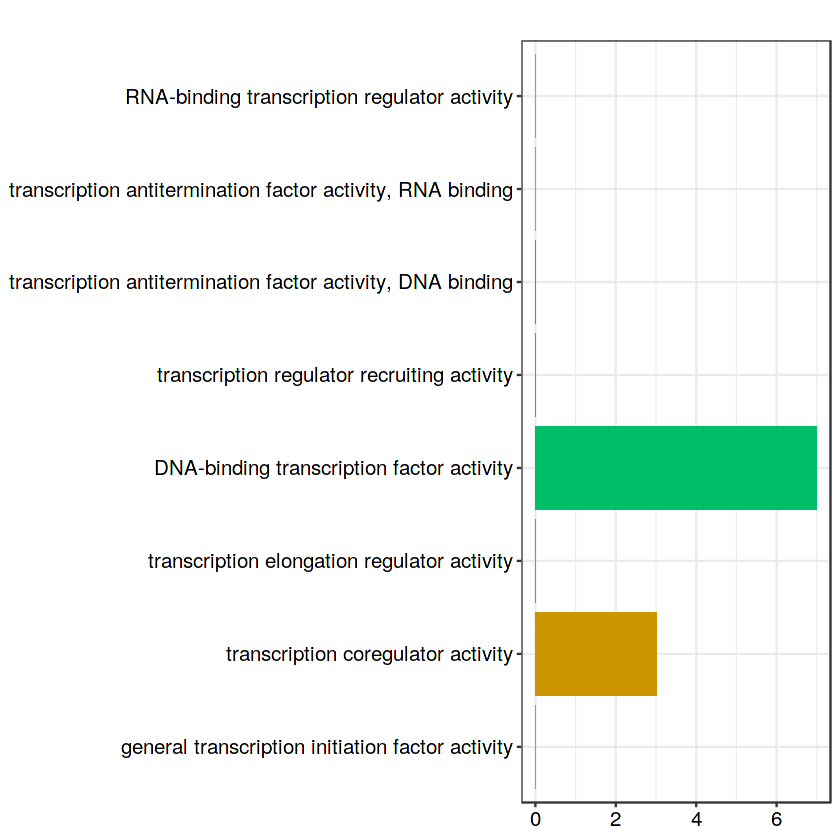

In [118]:
barplot(ggoKK_MF_3_1)

### 5. GO enrichment analysis

In [98]:
egoCA_MF <- enrichGO(gene=nidCA$ENTREZID, OrgDb=org.Mm.eg.db, ont="MF", pAdjustMethod="BH", pvalueCutoff=0.05, readable=TRUE)
egoKK_MF <- enrichGO(gene=nidKK$ENTREZID, OrgDb=org.Mm.eg.db, ont="MF", pAdjustMethod="BH", pvalueCutoff=0.05, readable=TRUE)

In [100]:
head(egoKK_MF)

ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count


In [101]:
egoCA_BP <- enrichGO(gene=nidCA$ENTREZID, OrgDb=org.Mm.eg.db, ont="BP", pAdjustMethod="BH", pvalueCutoff=0.05, readable=TRUE)
egoKK_BP <- enrichGO(gene=nidKK$ENTREZID, OrgDb=org.Mm.eg.db, ont="BP", pAdjustMethod="BH", pvalueCutoff=0.05, readable=TRUE)

In [325]:
head(ego_BP, n=10)

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
GO:0007140,GO:0007140,male meiotic nuclear division,5/125,50/23239,7.251562e-06,0.01275550,0.01205286,Tex15/Tex19.1/Mael/Tdrd12/Tex11,5
GO:0022412,GO:0022412,cellular process involved in reproduction in multicellular organism,11/125,428/23239,2.056075e-05,0.01808318,0.01708706,Rnf17/Tex15/Zfp37/Tex19.1/Mael/Taf7l/Ptk2b/Tdrd12/Dazl/Tex11/Dpy19l2,11
GO:0140013,GO:0140013,meiotic nuclear division,7/125,174/23239,4.438560e-05,0.02602476,0.02459118,Tex15/Tex19.1/Mael/AI481877/Tdrd12/Dazl/Tex11,7
GO:1903046,GO:1903046,meiotic cell cycle process,7/125,194/23239,8.812938e-05,0.03875490,0.03662008,Tex15/Tex19.1/Mael/AI481877/Tdrd12/Dazl/Tex11,7
GO:0007129,GO:0007129,synapsis,4/125,48/23239,1.292418e-04,0.04546727,0.04296270,Tex15/Tex19.1/Mael/Tex11,4
GO:0045132,GO:0045132,meiotic chromosome segregation,5/125,95/23239,1.635127e-04,0.04793647,0.04529588,Tex15/Tex19.1/Mael/AI481877/Tex11,5


#### GO GSEA

In [106]:
egoCA_GS <- gseGO(geneList=geneListCA, OrgDb=org.Mm.eg.db, ont="MF", nPerm=1000, minGSSize=100, maxGSSize=500, pvalueCutoff=0.05, verbose=FALSE, keyType="SYMBOL")
egoKK_GS <- gseGO(geneList=geneListKK, OrgDb=org.Mm.eg.db, ont="MF", nPerm=1000, minGSSize=100, maxGSSize=500, pvalueCutoff=0.05, verbose=FALSE, keyType="SYMBOL")

no term enriched under specific pvalueCutoff...
no term enriched under specific pvalueCutoff...


### KEGG Enrichment

In [110]:
ekeCA <- enrichKEGG(gene=nidCA$ENTREZID, organism="mmu", pvalueCutoff=0.05)
ekeKK <- enrichKEGG(gene=nidKK$ENTREZID, organism="mmu", pvalueCutoff=0.05)

In [327]:
head(ekeCA)

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
mmu04151,mmu04151,PI3K-Akt signaling pathway,22/177,358/8370,5.988768e-06,0.001383405,0.001260793,20393/20750/16772/12125/12826/21687/231991/75778/24088/12827/14164/54635/21432/17311/14186/12444/14170/50791/22371/18595/16196/16416,22


In [112]:
head(ekeKK)

ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count


In [113]:
ekmCA <- enrichMKEGG(gene=nidCA$ENTREZID, organism="mmu")
ekmKK <- enrichMKEGG(gene=nidKK$ENTREZID, organism="mmu")

In [115]:
head(ekmKK)

ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count


### REACTOME enrichment

In [120]:
library(ReactomePA)
epaCA <- enrichPathway(gene=nidCA$ENTREZID, organism="mouse", pvalueCutoff=0.05)
epaKK <- enrichPathway(gene=nidKK$ENTREZID, organism="mouse", pvalueCutoff=0.05)

In [121]:
head(epaCA)

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
R-MMU-9006934,R-MMU-9006934,Signaling by Receptor Tyrosine Kinases,21/191,405/9114,0.0001108809,0.02717699,0.02322917,13982/22612/20750/19229/319520/16772/12826/24064/211323/109880/75778/12827/17395/14164/54635/17311/14186/14170/105855/18595/16416,21
R-MMU-5673001,R-MMU-5673001,RAF/MAP kinase cascade,15/191,242/9114,0.0001662510,0.02717699,0.02322917,319520/21687/17967/211323/109880/14164/17311/14186/54153/14811/14170/22371/18595/18218/16416,15
R-MMU-5683057,R-MMU-5683057,MAPK family signaling cascades,16/191,273/9114,0.0001922455,0.02717699,0.02322917,319520/21687/225724/17967/211323/109880/14164/17311/14186/54153/14811/14170/22371/18595/18218/16416,16
R-MMU-5684996,R-MMU-5684996,MAPK1/MAPK3 signaling,15/191,248/9114,0.0002174159,0.02717699,0.02322917,319520/21687/17967/211323/109880/14164/17311/14186/54153/14811/14170/22371/18595/18218/16416,15
R-MMU-5654733,R-MMU-5654733,Negative regulation of FGFR4 signaling,5/191,29/9114,0.0003025565,0.03025565,0.02586062,24064/109880/14164/14186/14170,5
R-MMU-2243919,R-MMU-2243919,Crosslinking of collagen fibrils,4/191,18/9114,0.0004542662,0.03785552,0.03235651,12826/69675/12827/12153,4


In [123]:
head(epaKK)

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
R-MMU-198933,R-MMU-198933,Immunoregulatory interactions between a Lymphoid and a non-Lymphoid cell,5/45,100/9114,0.0001240704,0.02332524,0.02272448,140792/77777/12483/231805/17470,5


## Enrichment Visulisations

In [124]:
library(enrichplot)

In [126]:
edoCA <- enrichDGN(nidCA$ENTREZID)
edoKK <- enrichDGN(nidKK$ENTREZID)
# We can possibly do that if we transform to human orthologous genes.

--> No gene can be mapped....
--> Expected input gene ID: 2688,1641,6925,5627,2155,2475
--> return NULL...
--> No gene can be mapped....
--> Expected input gene ID: 80326,6662,4023,10564,54474,9436
--> return NULL...


In [127]:
ls()

[1] "convt"        "dCA"          "dCAs"         "dCAsf"        "dKK"         
 [6] "dKKs"         "dKKsf"        "edoCA"        "edoKK"        "egoCA_BP"    
[11] "egoCA_GS"     "egoCA_MF"     "egoCA_MF_3"   "egoKK_BP"     "egoKK_GS"    
[16] "egoKK_MF"     "egoKK_MF_3"   "ekeCA"        "ekeKK"        "ekmCA"       
[21] "ekmKK"        "em2CA"        "em2KK"        "emCA"         "emKK"        
[26] "epaCA"        "epaKK"        "ewpCA"        "ewpCA2"       "ewpKK"       
[31] "ewpKK2"       "geneListCA"   "geneListKK"   "ggoCA_MF_3"   "ggoKK_MF_3"  
[36] "gid"          "glCA"         "glKK"         "gn"           "i"           
[41] "m_df"         "mm"           "namesCA"      "namesCAs"     "namesCAwiki" 
[46] "namesCAwikiS" "namesKK"      "namesKKs"     "namesKKwiki"  "namesKKwikiS"
[51] "nidCA"        "nidKK"        "nn"           "wp"           "wp2genes"    
[56] "wpid2gene"    "wpid2geneID"  "wpid2name"

#### Ploting functional characterisation!

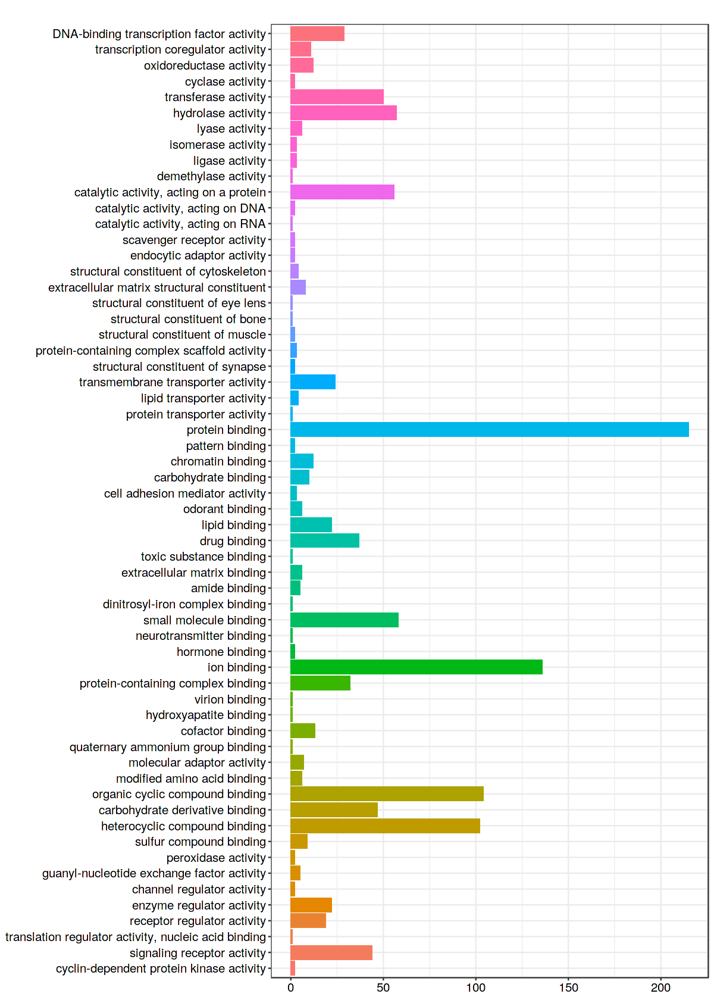

In [156]:
options(repr.plot.width=10,repr.plot.height=14)
barplot(ggoCA_MF_3, drop=TRUE, showCategory = 200)

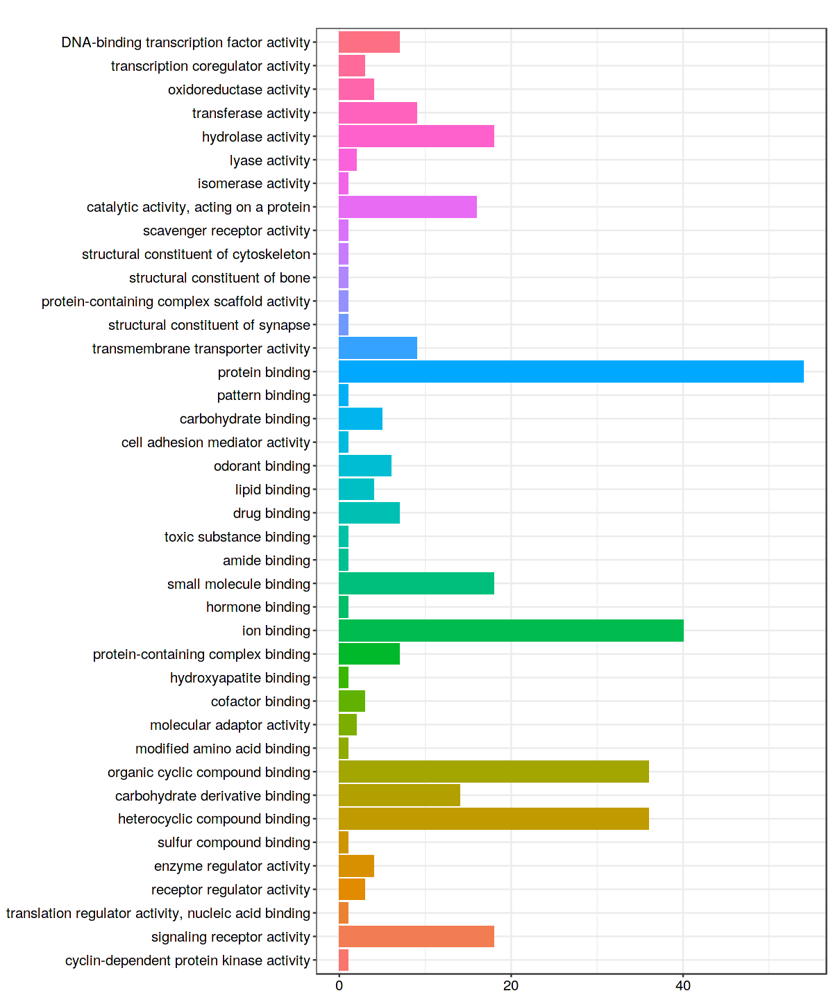

In [160]:
options(repr.plot.width=10,repr.plot.height=12)
barplot(ggoKK_MF_3, drop=TRUE, showCategory = 200)

#### Enrichment plots!

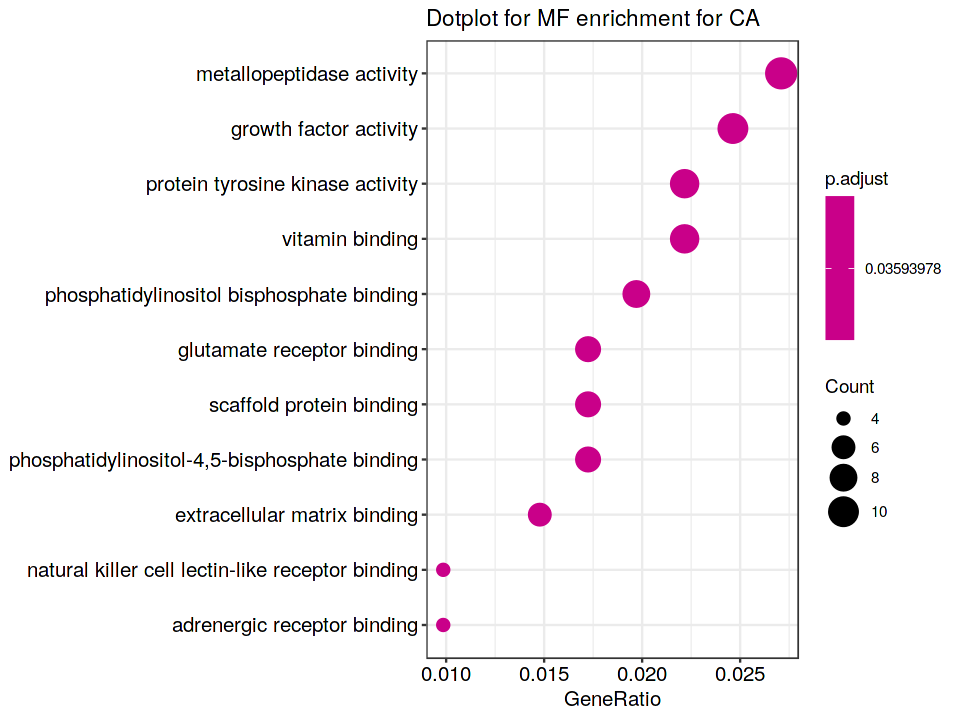

In [178]:
options(repr.plot.width=8,repr.plot.height=6)
dotplot(egoCA_MF, showCategory = 30) + ggtitle("Dotplot for MF enrichment for CA")

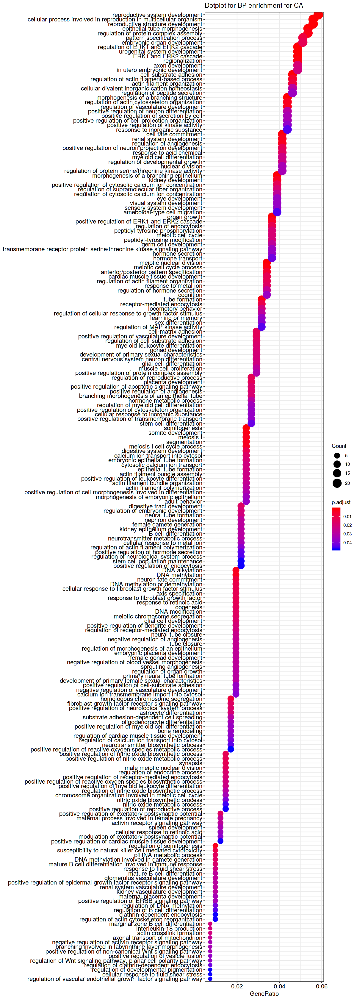

In [177]:
options(repr.plot.width=10,repr.plot.height=28)
dotplot(egoCA_BP, showCategory = 250) + ggtitle("Dotplot for BP enrichment for CA")

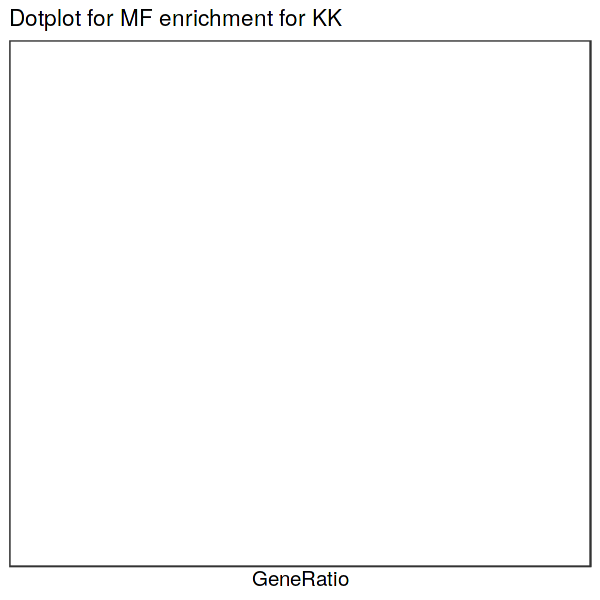

In [185]:
options(repr.plot.width=5,repr.plot.height=5)
dotplot(egoKK_MF, showCategory = 250) + ggtitle("Dotplot for MF enrichment for KK")

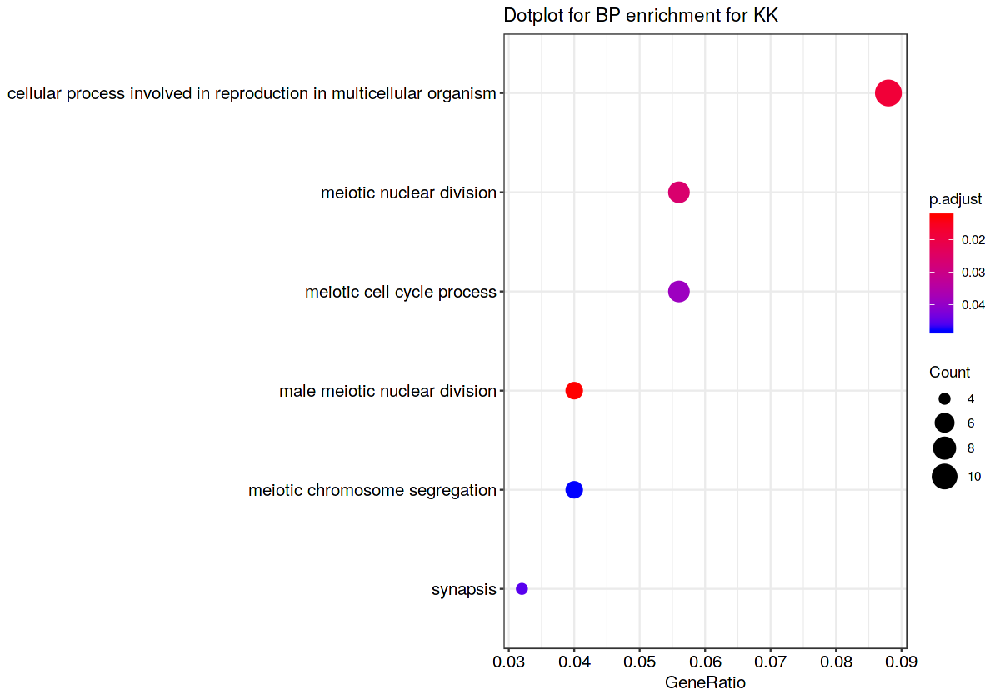

In [186]:
options(repr.plot.width=10,repr.plot.height=7)
dotplot(egoKK_BP, showCategory = 250) + ggtitle("Dotplot for BP enrichment for KK")

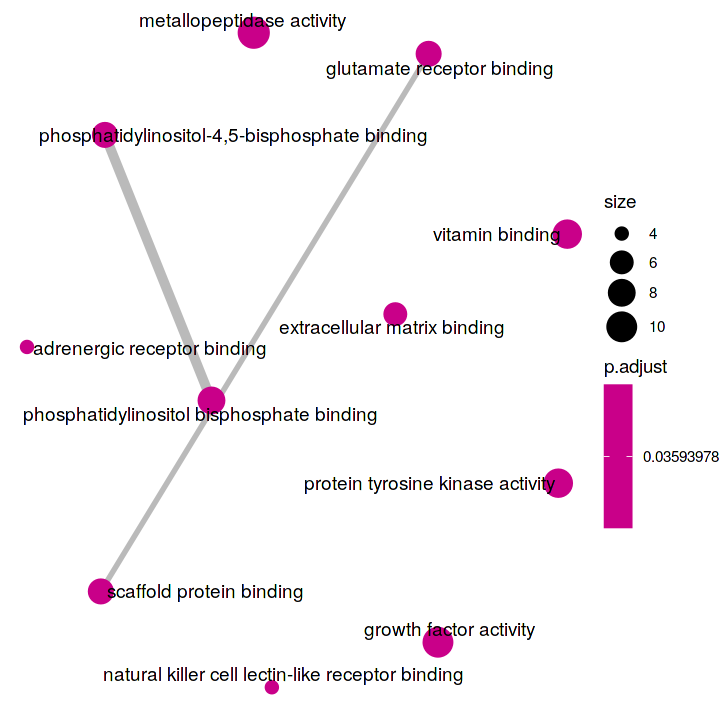

In [192]:
options(repr.plot.width=6,repr.plot.height=6)
emapplot(egoCA_MF)

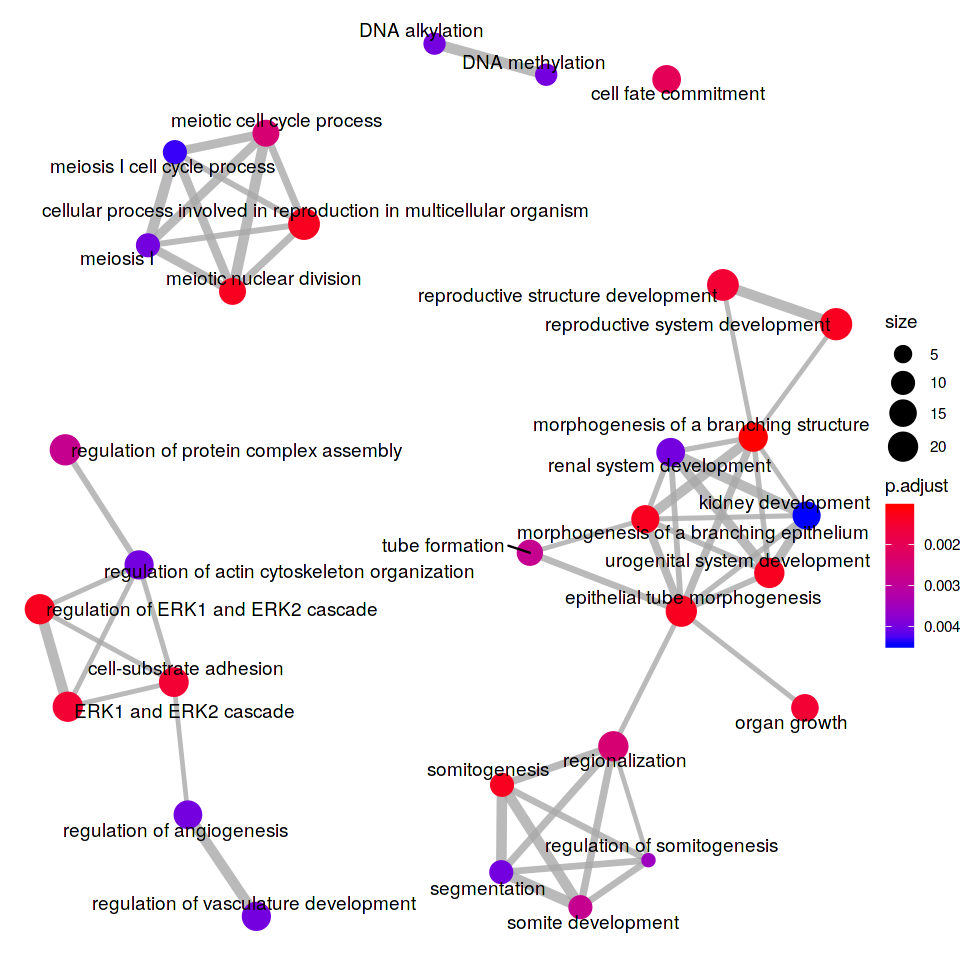

In [193]:
options(repr.plot.width=8,repr.plot.height=8)
emapplot(egoCA_BP)

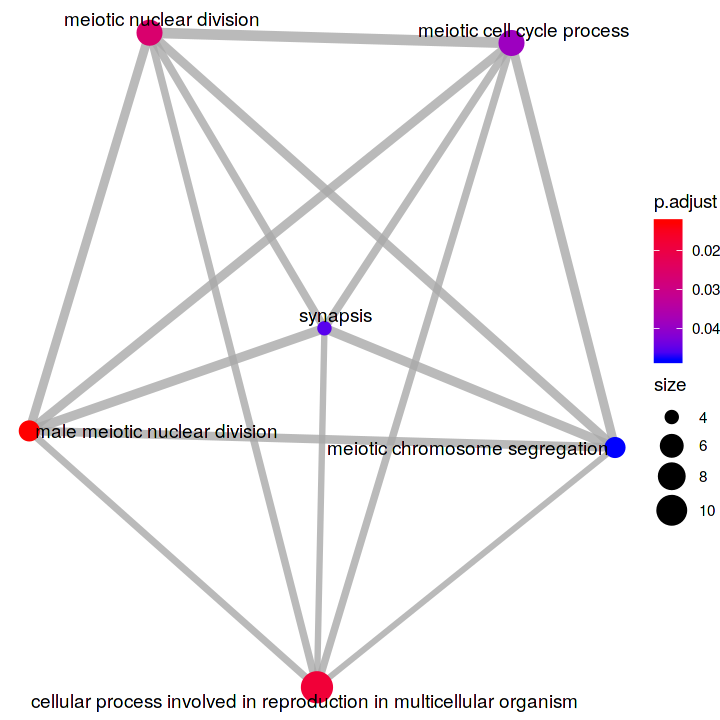

In [196]:
options(repr.plot.width=6,repr.plot.height=6)
emapplot(egoKK_BP)

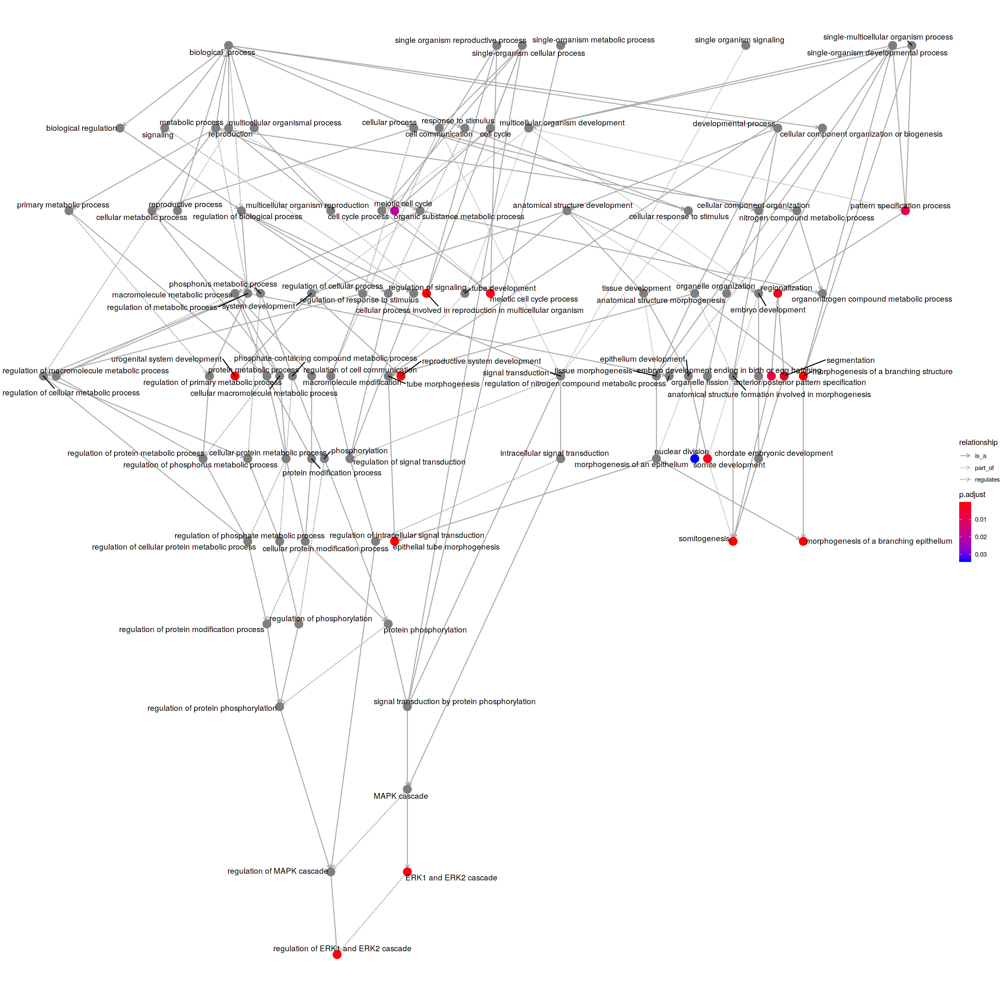

In [207]:
options(repr.plot.width=20,repr.plot.height=20)
goplot(egoCA_BP, showCategory=10, geom="text", alph=0.75)

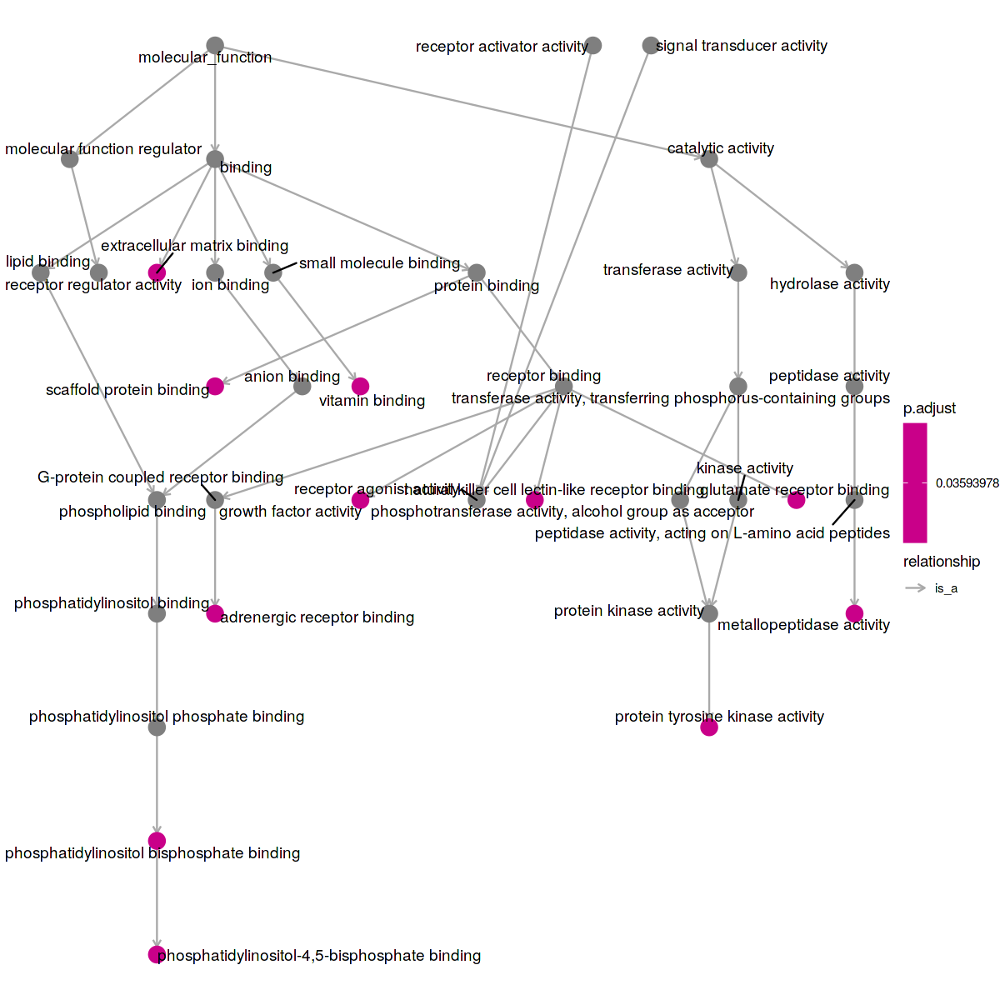

In [209]:
options(repr.plot.width=10,repr.plot.height=10)
goplot(egoCA_MF, showCategory=100, geom="text", alph=0.75)

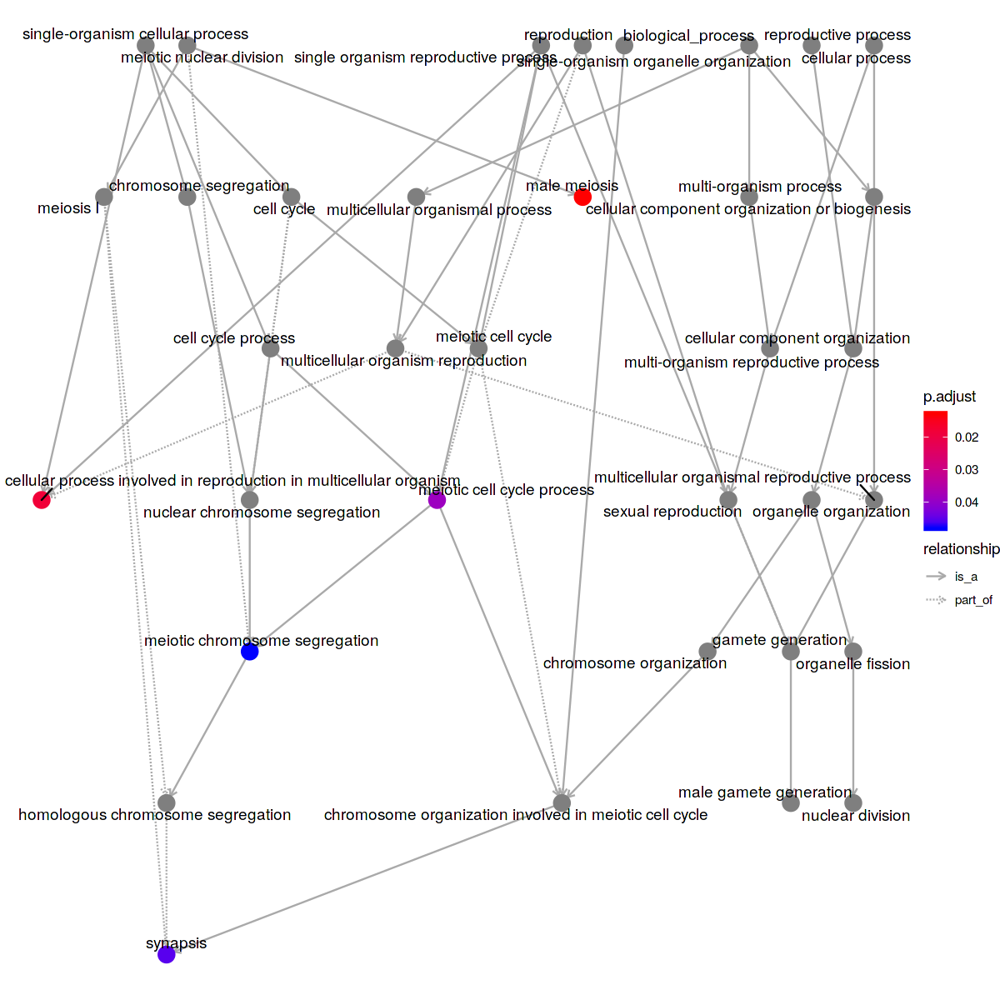

In [211]:
options(repr.plot.width=10,repr.plot.height=10)
goplot(egoKK_BP, showCategory=100, geom="text", alph=0.75)

### GSEA plots

In [214]:
edoCA_MF <- gseGO(geneListCA, nPerm=10000, OrgDb=org.Mm.eg.db, ont="MF", keyType = "SYMBOL")

preparing geneSet collections...
GSEA analysis...
leading edge analysis...
done...


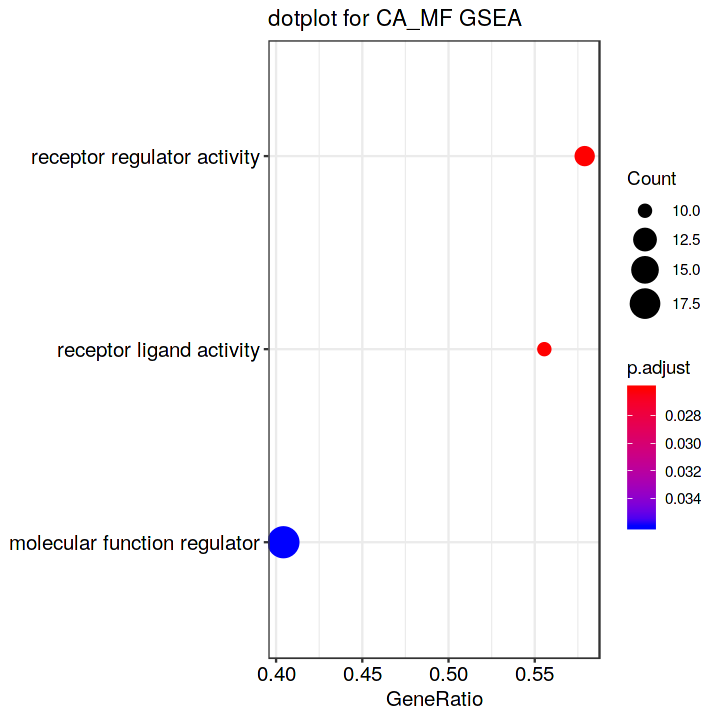

In [218]:
options(repr.plot.width=6, repr.plot.height=6)
dotplot(edoCA, showCategory=5) + ggtitle("dotplot for CA_MF GSEA")

In [219]:
edoCA_BP <- gseGO(geneListCA, nPerm=10000, OrgDb=org.Mm.eg.db, ont="BP", keyType = "SYMBOL")
edoKK_BP <- gseGO(geneListKK, nPerm=10000, OrgDb=org.Mm.eg.db, ont="BP", keyType = "SYMBOL")
edoKK_MF <- gseGO(geneListKK, nPerm=10000, OrgDb=org.Mm.eg.db, ont="MF", keyType = "SYMBOL")

preparing geneSet collections...
GSEA analysis...
leading edge analysis...
done...
preparing geneSet collections...
GSEA analysis...
no term enriched under specific pvalueCutoff...
preparing geneSet collections...
GSEA analysis...
no term enriched under specific pvalueCutoff...


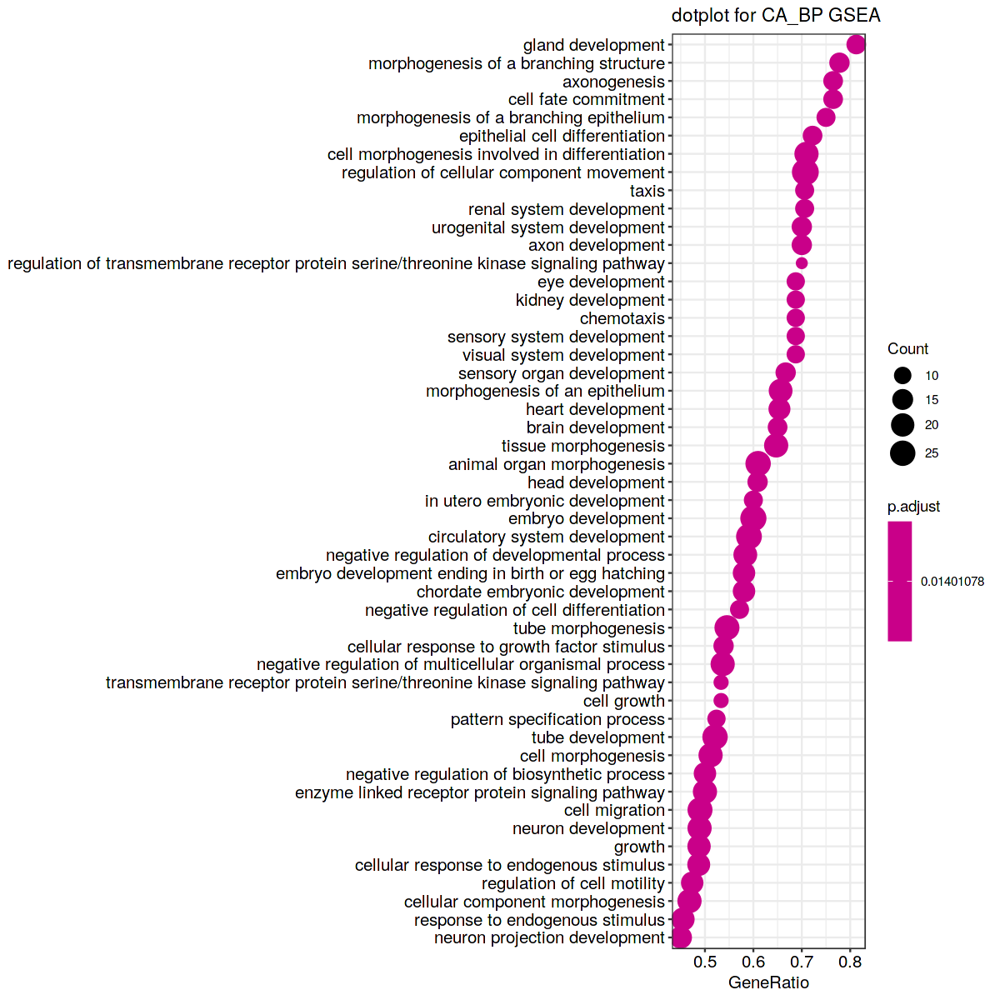

In [221]:
options(repr.plot.width=10, repr.plot.height=10)
dotplot(edoCA_BP, showCategory=50) + ggtitle("dotplot for CA_BP GSEA")

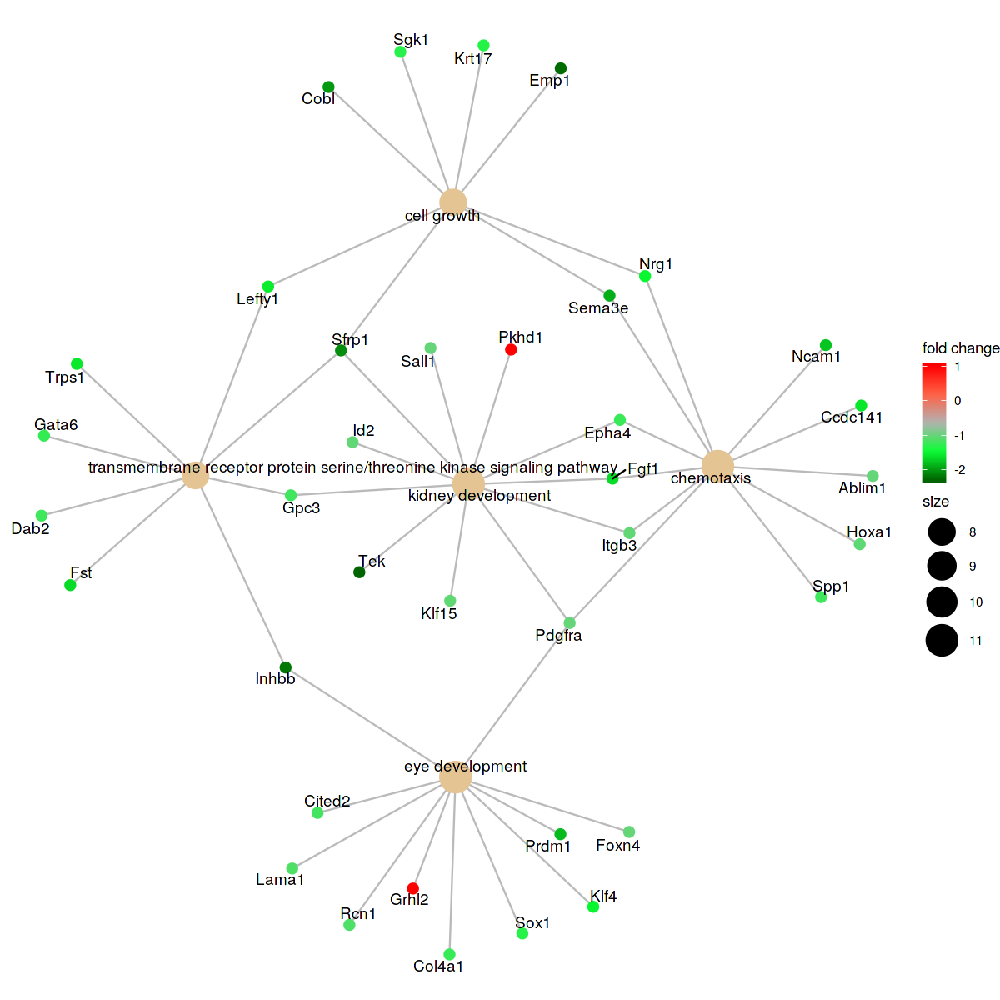

In [223]:
cnetplot(edoCA_BP, foldChange=geneListCA)

In [329]:
cnetplot(edoKK_BP, foldChange=geneListKK)

ERROR: Error in graph.data.frame(x, directed = FALSE): the data frame should contain at least two columns


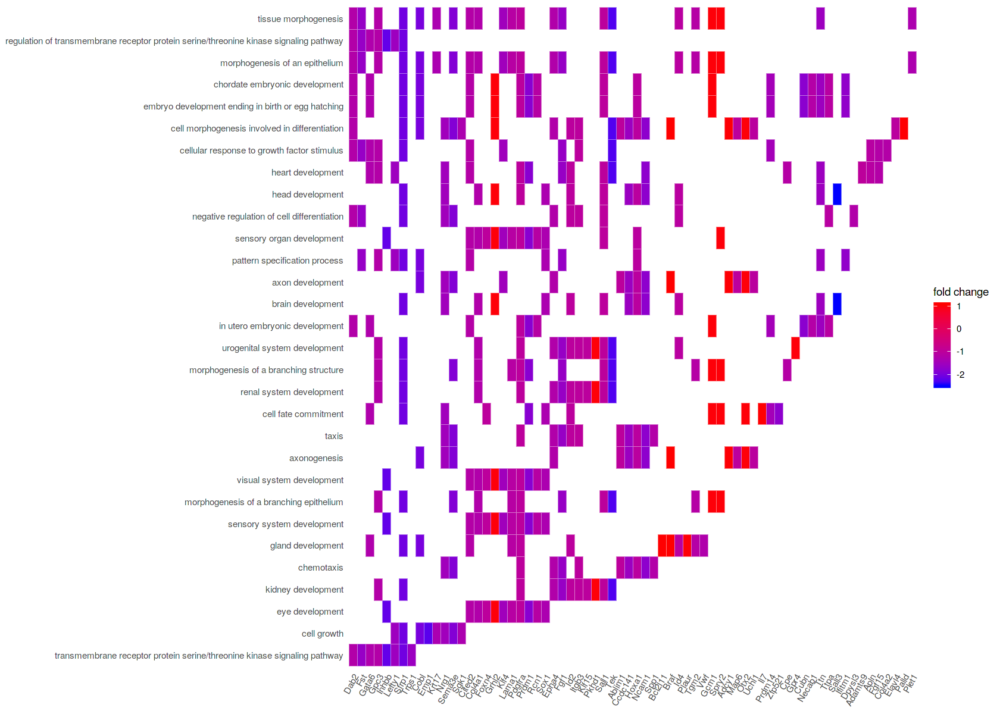

In [334]:
options(repr.plot.width=14, repr.plot.height=10)
heatplot(edoCA_BP, foldChange=geneListCA)

In [333]:
options(repr.plot.width=12, repr.plot.height=10)
heatplot(edoKK_BP, foldChange=geneListKK)

ERROR: Error in `[.data.frame`(d, , 2): undefined columns selected


Picking joint bandwidth of 0.203


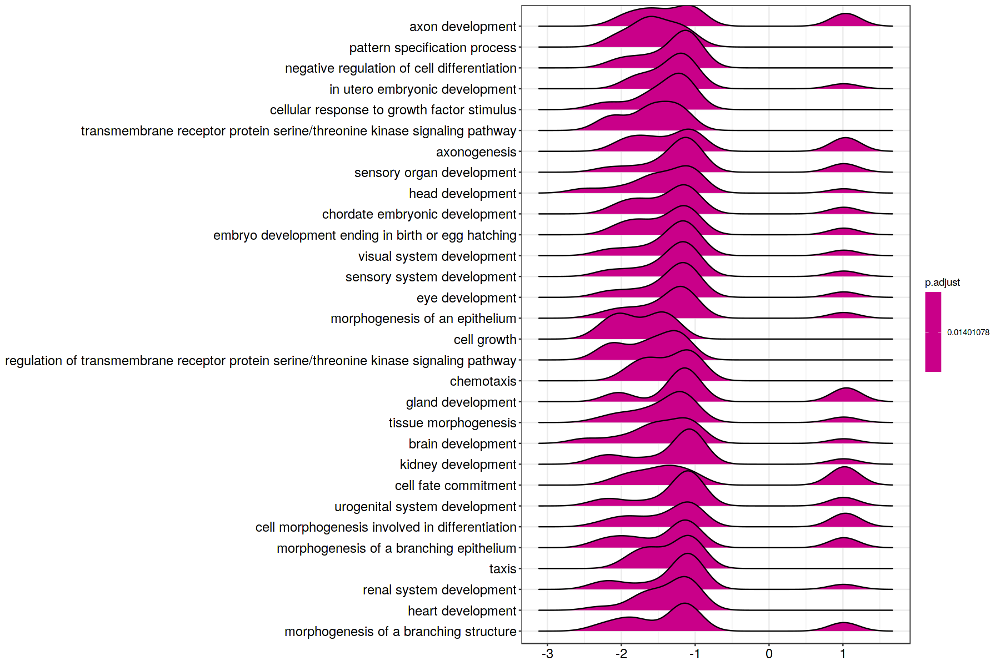

In [229]:
ridgeplot(edoCA_BP)

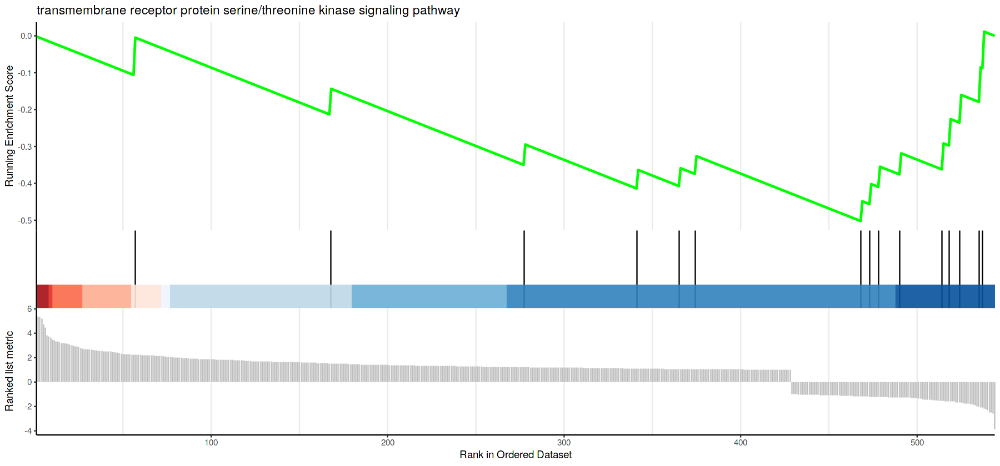

In [237]:
options(repr.plot.width=15, repr.plot.height=7)
gseaplot2(edoCA_BP, geneSetID = 1, title = edoCA_BP$Description[1])

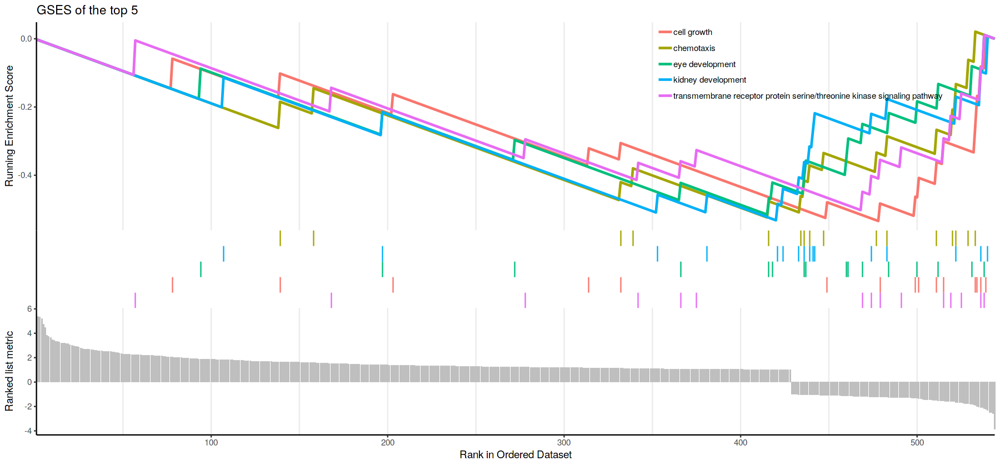

In [238]:
gseaplot2(edoCA_BP, geneSetID = 1:5, title = "GSES of the top 5")

## Clustering

In [285]:
# Collect data.
dCA <- read.table("tpm_WT_CA_KK_NLSB_degsCA_p05_fc1.tab", header=TRUE)
dKK <- read.table("tpm_WT_CA_KK_NLSB_degsKK_p05_fc1.tab", header=TRUE)
#Clean the zeros
dCA <- dCA[apply(dCA, 1, function(row) all(row !=0 )),]
dKK <- dKK[apply(dKK, 1, function(row) all(row !=0 )),]
summary(dCA)

  RNA.seq_Wt1        RNA.seq_Wt2        RNA.seq_Wt3        RNA.seq_CA1       
 Min.   :  0.0207   Min.   :  0.0103   Min.   :  0.0097   Min.   :   0.0258  
 1st Qu.:  1.2507   1st Qu.:  1.1520   1st Qu.:  1.1889   1st Qu.:   2.6571  
 Median :  3.2698   Median :  3.1120   Median :  3.2154   Median :   8.4475  
 Mean   : 14.1802   Mean   : 14.0779   Mean   : 14.3410   Mean   :  29.6025  
 3rd Qu.: 10.8540   3rd Qu.:  9.7861   3rd Qu.: 10.2317   3rd Qu.:  23.4616  
 Max.   :612.6390   Max.   :610.2147   Max.   :654.9134   Max.   :1282.6848  
  RNA.seq_CA2         RNA.seq_CA3         RNA.seq_KK1        RNA.seq_KK2      
 Min.   :   0.0253   Min.   :   0.0602   Min.   :  0.0297   Min.   :  0.0274  
 1st Qu.:   2.5201   1st Qu.:   2.7405   1st Qu.:  2.4530   1st Qu.:  2.2721  
 Median :   8.2630   Median :   8.5968   Median :  5.8890   Median :  5.7604  
 Mean   :  30.1515   Mean   :  30.7809   Mean   : 21.5462   Mean   : 20.6623  
 3rd Qu.:  22.7100   3rd Qu.:  23.1678   3rd Qu.: 18.2163  

In [286]:
ddCA <- log10(dCA[,c(1,2,3,4,5,6)])
ddKK <- log10(dKK[,c(1,2,3,7,8,9)])
ddKK


,RNA.seq_Wt1,RNA.seq_Wt2,RNA.seq_Wt3,RNA.seq_KK1,RNA.seq_KK2,RNA.seq_KK3
1700029P11Rik,0.8930640,0.99405215,0.89786905,1.37834350,1.3293201,1.3504127
1700030C10Rik,1.1404738,1.03769934,1.08680255,1.45015073,1.3962297,1.4271427
2810429I04Rik,0.6997871,0.57680926,0.61674214,1.02281185,0.9798290,0.9660034
2810474O19Rik,1.8200645,1.77964544,1.82213523,2.19721470,2.1476870,2.1575408
8030474K03Rik,0.2576842,0.15569720,0.14763344,0.91487096,0.9505722,0.8788803
AC166344.3,-0.6288909,-0.42608780,-0.65675496,0.27509401,0.1493890,0.1237100
AC167192.1,0.7472130,0.64898611,0.68716427,1.25103645,1.1922782,1.1732298
AI481877,-0.4343701,-0.30440805,-0.24552503,0.60714270,0.5863033,0.5811403
AU022751,-0.2040434,-0.46860171,-0.23190745,0.35751884,0.3724327,0.3780701
Ankrd33b,0.3668179,0.45866477,0.35721515,0.76577968,0.7593661,0.7424686


### Determine number of clusters

In [314]:
# determine number of cluster by plotting sum of squares whitnin groups
wssCA <- (nrow(ddCA))*sum(apply(ddCA,2,var))

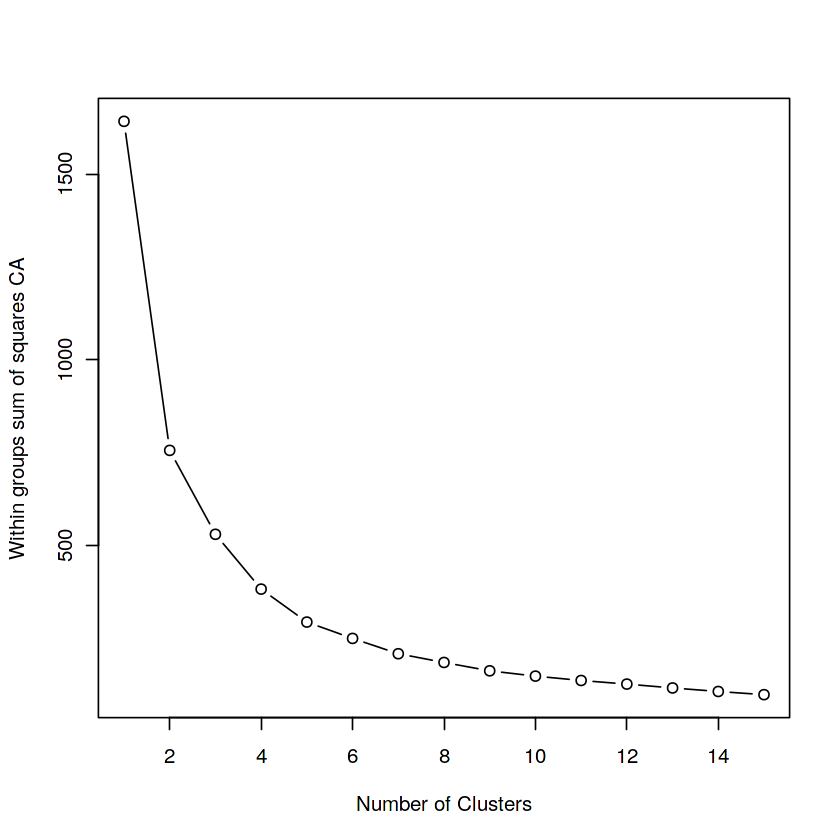

In [315]:
for (i in 2:15) wssCA[i] <- sum(kmeans(ddCA, centers=i, iter.max = 100, nstart = 250)$withinss)
options(repr.plot.width=7, repr.plot.height=7)
my_palette <- brewer.pal(n = 11, name = "RdYlGn")
plot(1:15, wssCA, type="b", xlab="Number of Clusters", ylab="Within groups sum of squares CA")

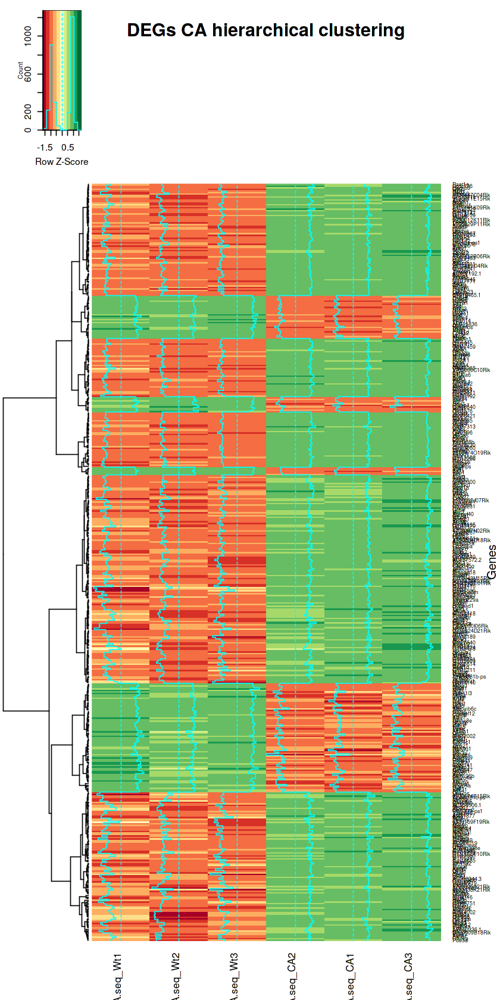

In [316]:
library(RColorBrewer)
library(gplots)
my_palette <- brewer.pal(n = 11, name = "RdYlGn")
# Hierarhical clustering
options(repr.plot.width=7, repr.plot.height=14)
heatmap.2(as.matrix(ddCA), scale="row", col=my_palette, dendrogram = "row", cexCol = 1, cexRow = 0.5, key.title = NA, keysize = 0.9, main = "DEGs CA hierarchical clustering", ylab = "Genes", hclustfun=function(x) hclust(x, method="ward.D2"))

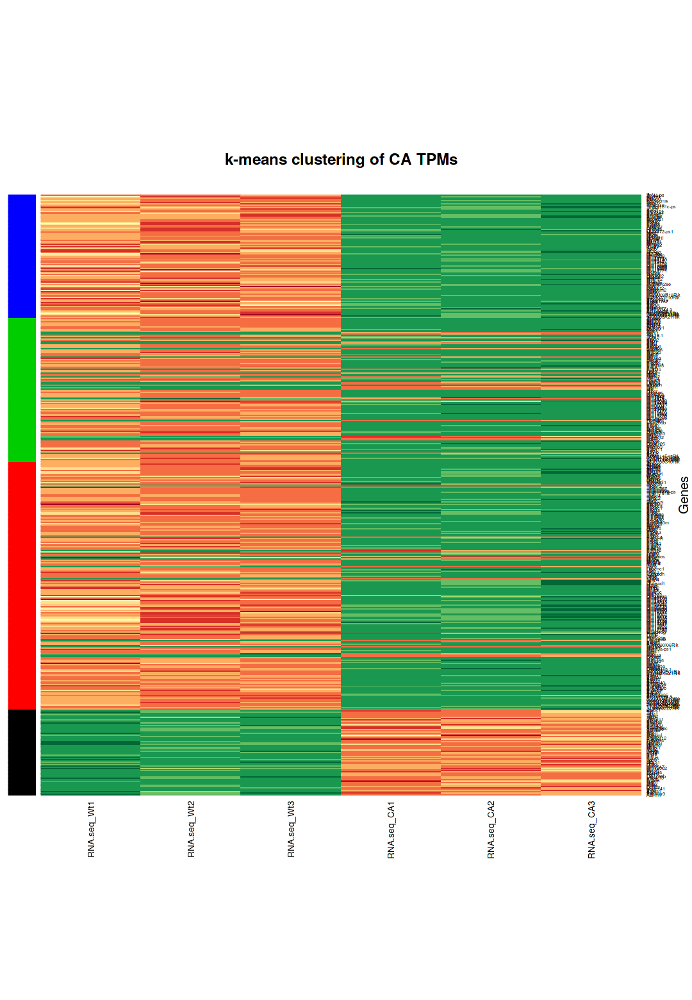

In [319]:
# Perform k-means clustering
set.seed(1)  # Always set the same random seed.
k <- kmeans(as.matrix(ddCA), 4, iter.max = 200, nstart = 500)

# Append id and cluster
dfcall <- cbind(ddCA, id=seq(nrow(ddCA)), cluster=k$cluster)

# Add idsort, the id number ordered by cluster
dfcall$idsort <- dfcall$id[order(dfcall$cluster)]
dfcall$idsort <- order(dfcall$idsort)

clusterCols <- as.character(sort(k$cluster))
#clusterCols <- str_replace_all(clusterCols, "1", "grey") #to change colors

# Plot k-means clustering.
options(repr.plot.width=9, repr.plot.height=13)
heatmap(as.matrix(ddCA)[order(k$cluster),], Rowv=NA, col=my_palette, Colv=NA, cexCol=1, cexRow = 0.5, RowSideColors=clusterCols, ylab="Genes", main="k-means clustering of CA TPMs")

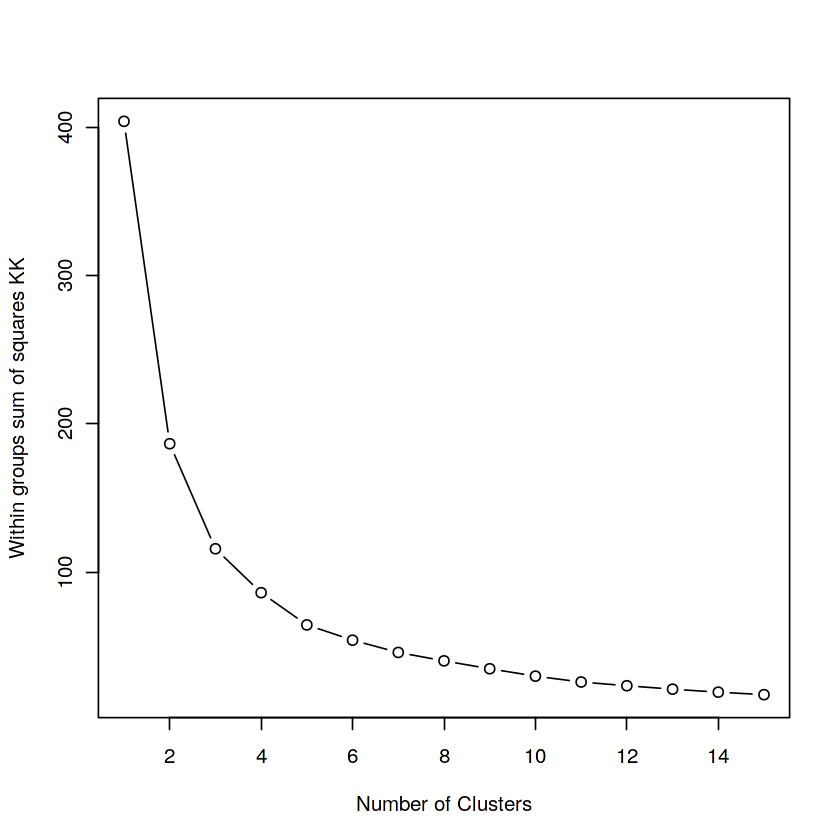

In [320]:
# For the KK DEGs.
# determine number of cluster by plotting sum of squares whitnin groups
wssKK <- (nrow(ddKK))*sum(apply(ddKK,2,var))
for (i in 2:15) wssKK[i] <- sum(kmeans(ddKK, centers=i, iter.max = 100, nstart = 250)$withinss)
options(repr.plot.width=7, repr.plot.height=7)
plot(1:15, wssKK, type="b", xlab="Number of Clusters", ylab="Within groups sum of squares KK")

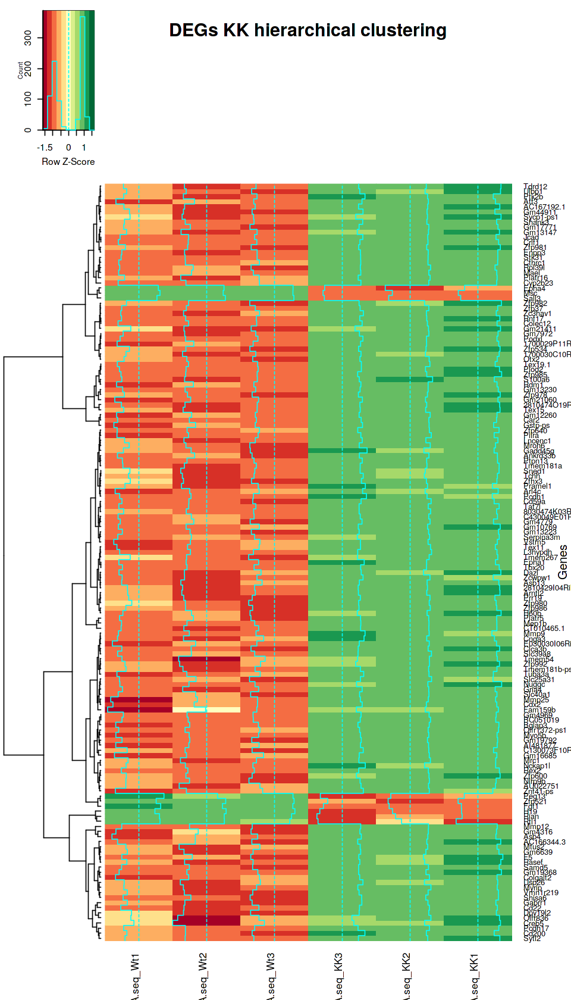

In [321]:
# Hierarchical clustering
options(repr.plot.width=8, repr.plot.height=14)
heatmap.2(as.matrix(ddKK), scale="row", col=my_palette, dendrogram = "row", cexCol = 1, cexRow = 0.75, key.title = NA, keysize = 0.9, main = "DEGs KK hierarchical clustering", ylab = "Genes", hclustfun=function(x) hclust(x, method="ward.D2"))

ERROR: Error in eval(expr, envir, enclos): object 'ddKK' not found


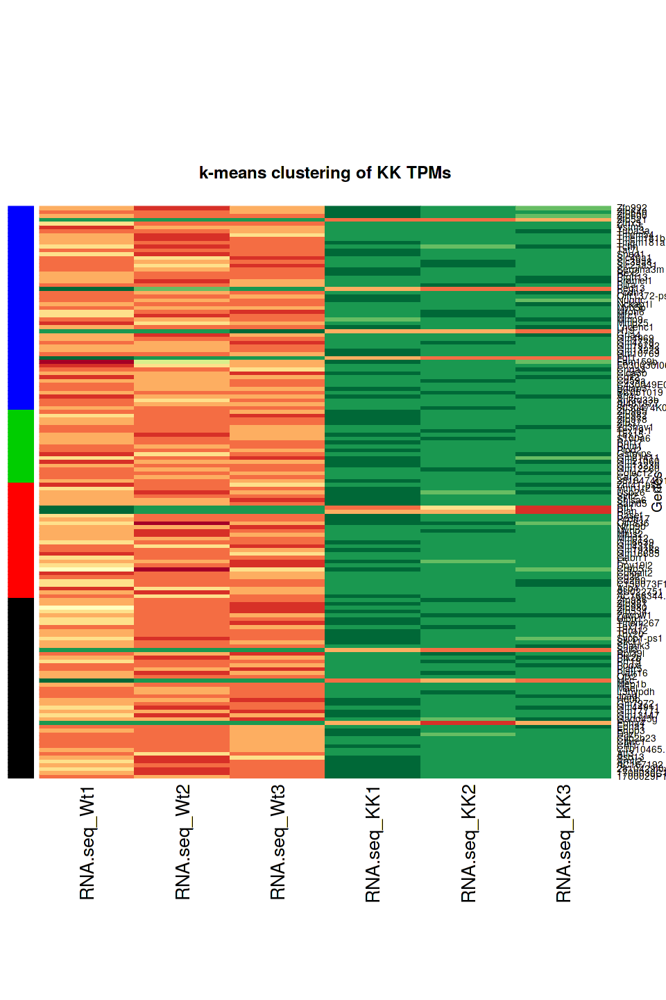

In [323]:
# Perform k-means clustering
set.seed(1)  # Always set the same random seed.
k <- kmeans(as.matrix(ddKK), 4, iter.max = 200, nstart = 500)

# Append id and cluster
dfcall <- cbind(ddKK, id=seq(nrow(ddKK)), cluster=k$cluster)

# Add idsort, the id number ordered by cluster
dfcall$idsort <- dfcall$id[order(dfcall$cluster)]
dfcall$idsort <- order(dfcall$idsort)

clusterCols <- as.character(sort(k$cluster))
# Plot k-means clustering.
options(repr.plot.width=8, repr.plot.height=12)
heatmap(as.matrix(ddKK)[order(k$cluster),], Rowv=NA, Colv=NA, col=my_palette, cexCol=2, cexRow = 1, RowSideColors=clusterCols, ylab="Genes", main="k-means clustering of KK TPMs")